# Taller 4

### Gustavo Alonso Gomez Morales

In [18]:
import sys
import os

notebook_dir = os.path.abspath('.')
parent_dir = os.path.dirname(notebook_dir)
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

from util import *

import numpy as np
import matplotlib.pyplot as plt
import cv2
from IPython.display import Image


## Punto 1

¡Hugo, Paco y Luis necesitan tu ayuda! Los pobres muchachos requieren encontrar un tesoro, espero que tú (Tío Rico) seas capaz de llevarlos a su primer millón. Hay 4 formas con las que vas a llegar al tesoro:
<br>
<ul>
    <li>Escala la imagen a 1080*720</li>
    <li>Realiza una reflexión horizontal con una imagen escalada a 1280*800</li>
    <li>Realiza una inclinación en y de 0.3</li>
    <li>Mueve la imagen en x en un 20%, en y al 30%. En caso tal de que haya espacios negros (vacíos), deberás de rellenarlos con el promedio de la escala de grises de la imagen (Si desea hacerlo, puede usar una distribución normal para rellenar el espacio negro)</li>
</ul>

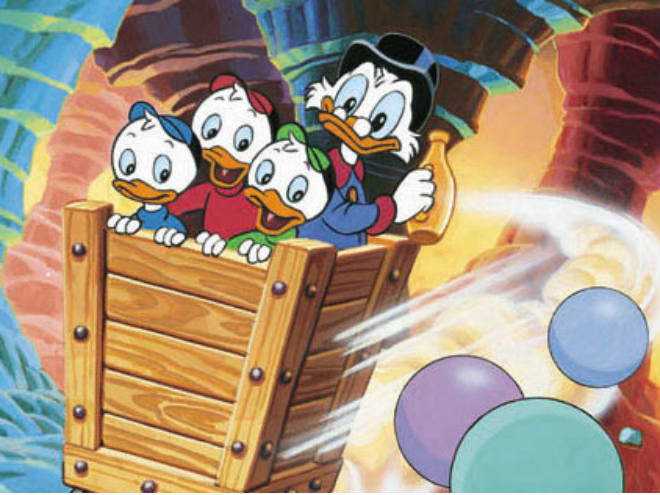

In [19]:
Image("res/activity-1/first.jpg")

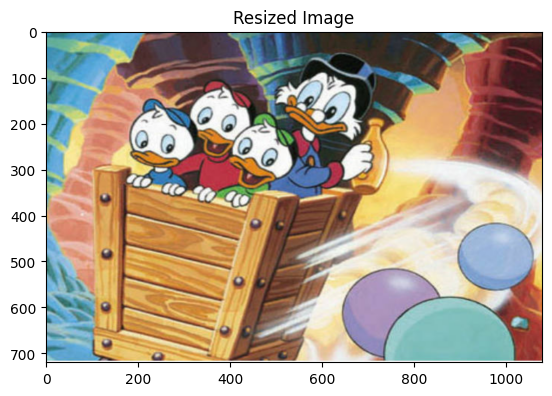

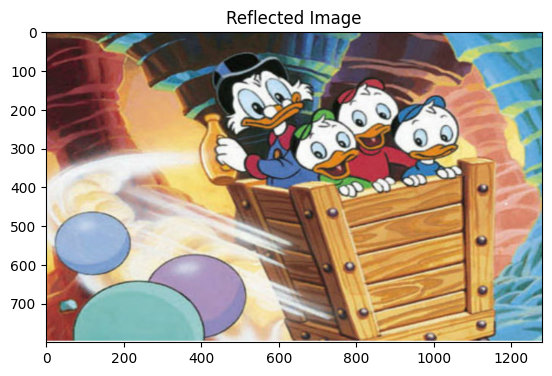

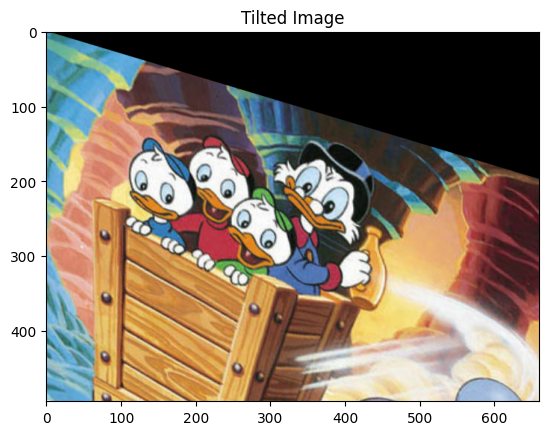

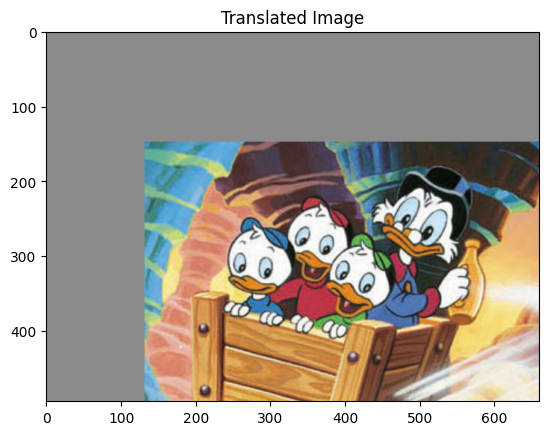

In [20]:
original_image = image_read('res/activity-1/first.jpg')

resized_image_1 = scaling_transformation(original_image, (1080, 720))
image_show(resized_image_1, "Resized Image")

resized_image_2 = scaling_transformation(original_image, (1280, 800))
reflected_image = reflection_transformation(resized_image_2, "x")
image_show(reflected_image, "Reflected Image")

tilted_image = inclination_transformation(original_image, incl_x=0.0, incl_y=0.3)
image_show(tilted_image, "Tilted Image")

gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
gray_mean = np.mean(gray)

mov_x = int(0.20 * original_image.shape[1])
mov_y = int(0.30 * original_image.shape[0])

translated_image = translation_transformation(original_image, mov_x, mov_y)
gray_image = np.full_like(translated_image, gray_mean, dtype=np.uint8)
mask = np.all(translated_image == 0, axis=-1)
translated_image[mask] = gray_image[mask]
image_show(translated_image, "Translated Image")


## Punto 2

En este punto, usted deberá de realizar una función de ruido que sea de pimienta y granular (mínimo el 20% de la imagen debe de tener ruido, esto se debe hacer en RGB)

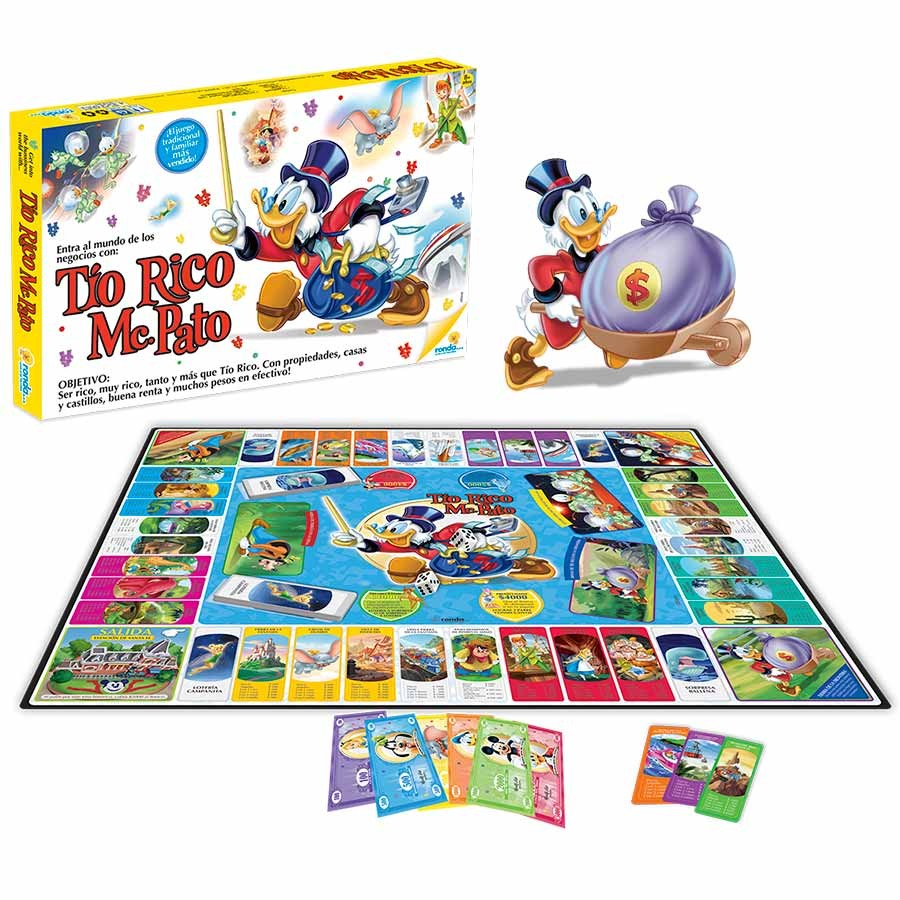

In [21]:
Image("res/activity-2/second.jpg")

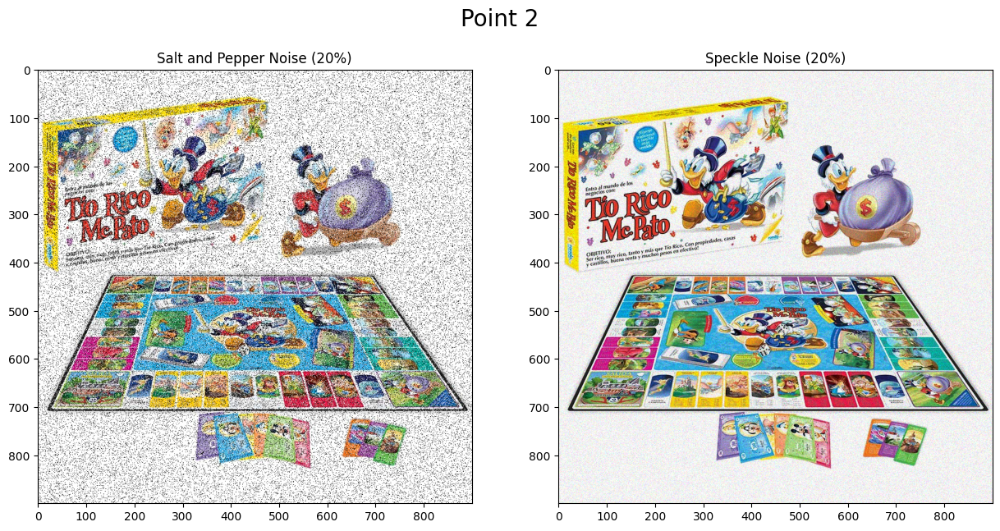

In [22]:
original_image = image_read('res/activity-2/second.jpg')

image_with_salt_and_pepper = add_salt_and_pepper_noise(original_image, amount=0.20)
image_with_speckle = add_speckle_noise(original_image, amount=0.2, distr_width=1.0)
subplot_images("Point 2", images=[image_with_salt_and_pepper, image_with_speckle], images_name=["Salt and Pepper Noise (20%)", "Speckle Noise (20%)"])



## Punto 3

Agarre la imagen resultado del punto anterior y realice un filtro tal que se puedan eliminar algunas imperfecciones de la imagen (No tiene que quedar perfecto, la idea es que entienda las utilidades de cada filtrado)

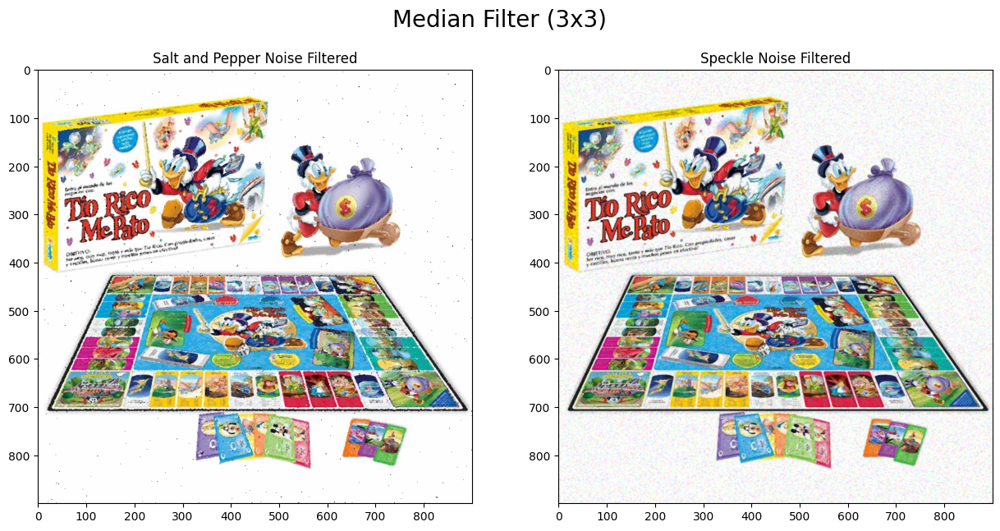

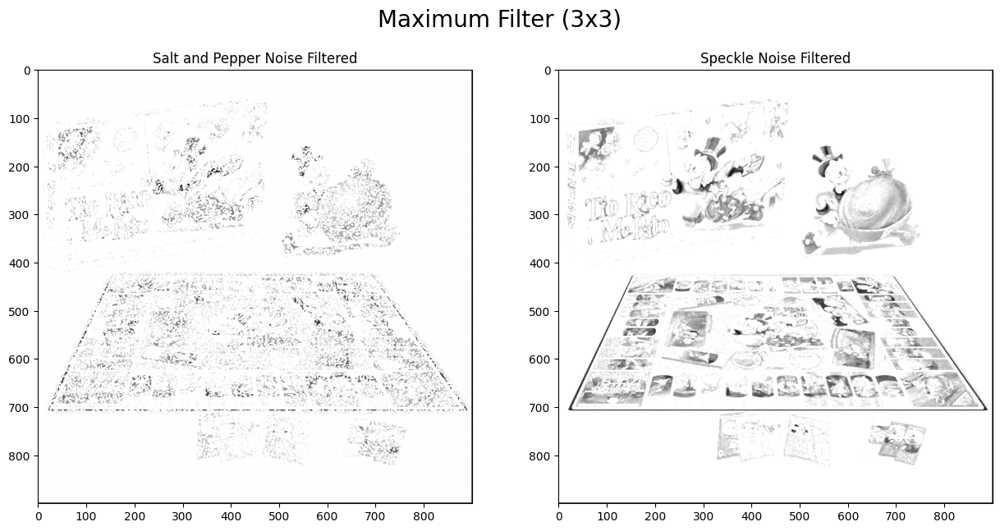

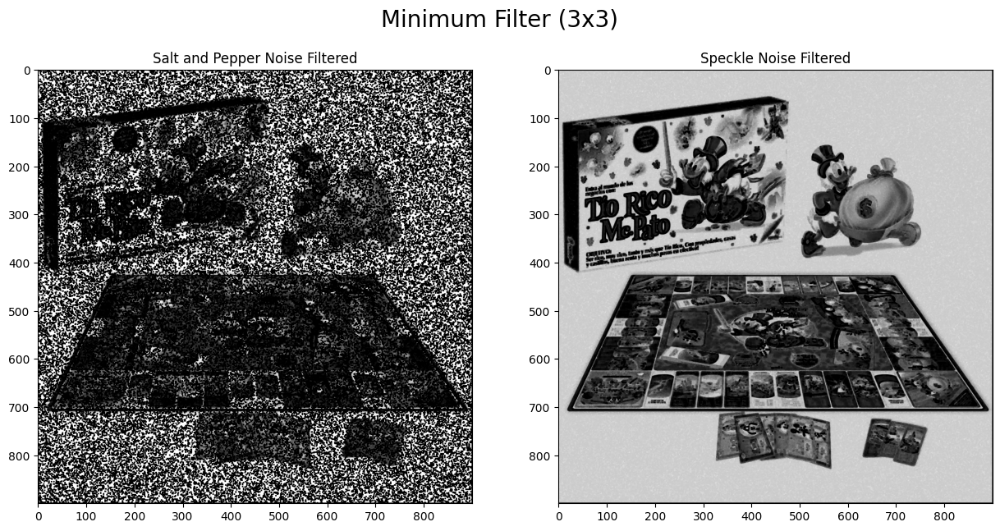

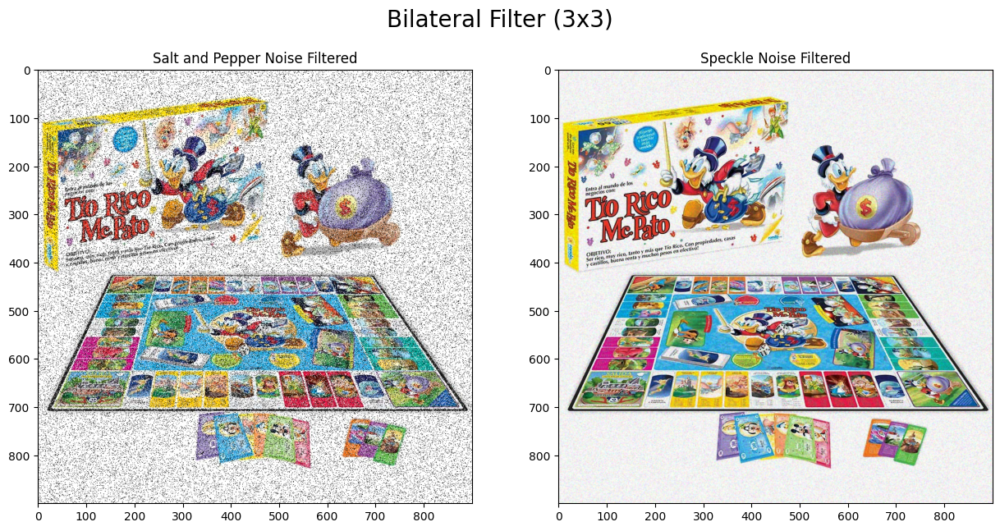

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


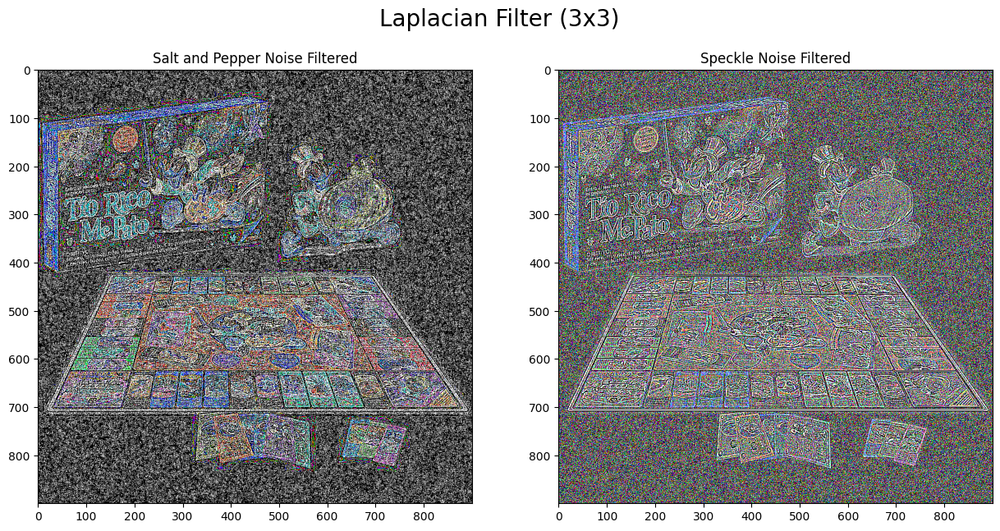

In [23]:
image_with_salt_and_pepper_median_filtered = median_filter(image_with_salt_and_pepper, size=3)
image_with_speckle_median_filtered = median_filter(image_with_speckle, size=3)
subplot_images(title="Median Filter (3x3)", images=[image_with_salt_and_pepper_median_filtered, image_with_speckle_median_filtered], images_name=["Salt and Pepper Noise Filtered", "Speckle Noise Filtered"])

image_with_salt_and_pepper_maximum_filtered = maximum_filter(image_with_salt_and_pepper, size=3)
image_with_speckle_maximum_filtered = maximum_filter(image_with_speckle, size=3)
subplot_images(title="Maximum Filter (3x3)", images=[image_with_salt_and_pepper_maximum_filtered, image_with_speckle_maximum_filtered], images_name=["Salt and Pepper Noise Filtered", "Speckle Noise Filtered"])

image_with_salt_and_pepper_minimum_filtered = minimum_filter(image_with_salt_and_pepper, size=3)
image_with_speckle_minimum_filtered = minimum_filter(image_with_speckle, size=3)
subplot_images(title="Minimum Filter (3x3)", images=[image_with_salt_and_pepper_minimum_filtered, image_with_speckle_minimum_filtered], images_name=["Salt and Pepper Noise Filtered", "Speckle Noise Filtered"])

image_with_salt_and_pepper_bilateral_filtered = bilateral_filter(image_with_salt_and_pepper, d=3, sigma_color=75, sigma_space=75)
image_with_speckle_bilateral_filtered = bilateral_filter(image_with_speckle, d=3, sigma_color=75, sigma_space=75)
subplot_images(title="Bilateral Filter (3x3)", images=[image_with_salt_and_pepper_bilateral_filtered, image_with_speckle_bilateral_filtered], images_name=["Salt and Pepper Noise Filtered", "Speckle Noise Filtered"])

image_with_salt_and_pepper_laplace_filtered = laplacian_filter(image_with_salt_and_pepper, ksize=3)
image_with_speckle_laplace_filtered = laplacian_filter(image_with_speckle, ksize=3)
subplot_images(title="Laplacian Filter (3x3)", images=[image_with_salt_and_pepper_laplace_filtered, image_with_speckle_laplace_filtered], images_name=["Salt and Pepper Noise Filtered", "Speckle Noise Filtered"])
